In [2]:
import numpy as np
import plotly.graph_objects as go
import open3d as o3d
import cv2
import matplotlib.pyplot as plt

Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


In [3]:
pc_path = '/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_pc.npy'
pc_np = np.load(pc_path)

In [4]:
rgb_img = cv2.imread('/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_rgb0000.png')
rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
rgb_3d = rgb_img.reshape(-1, 3)

pc_3d = pc_np.reshape(-1, 3)

# drop nans
rgb_3d = rgb_3d[~np.isnan(pc_3d).any(axis=1)]
pc_3d = pc_3d[~np.isnan(pc_3d).any(axis=1)]
pc_3d.shape, rgb_3d.shape

((801854, 3), (801854, 3))

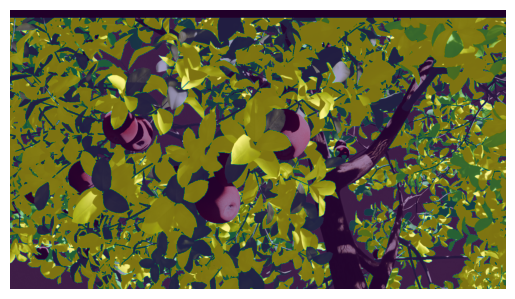

In [5]:
import sys 
sys.path.append('/home/siddhartha/RIVAL/learning2localize/blender/')
import utils
visible_objs, id_mask, instance_mask, id_to_name = utils.get_visible_objects(
    exr_path='/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_id0000.exr',
    id_mapping_path='/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_id_map.json')

plt.imshow(rgb_img)
plt.imshow(id_mask / np.max(id_mask), alpha=0.5)
plt.axis('off')
plt.show()

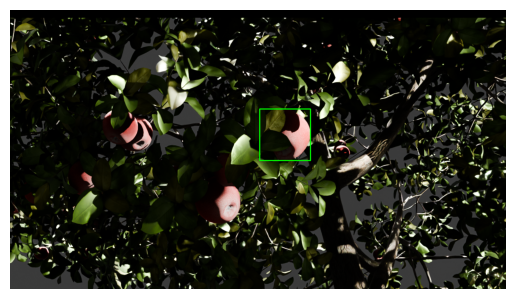

In [6]:
rgb_cp = rgb_img.copy()
x1, y1, x2, y2 = 644.0, 388.0, 775.0, 255.0
cv2.rectangle(rgb_cp, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
plt.imshow(rgb_cp)
plt.axis('off')
plt.show()

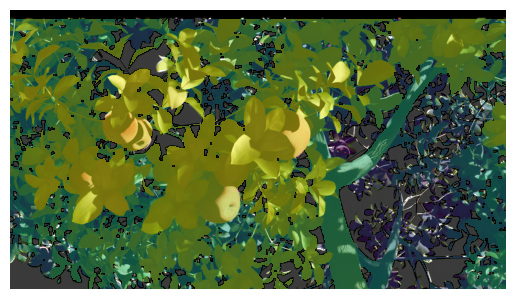

-1.4038584232330322

In [7]:
plt.imshow(rgb_img)
plt.axis('off')
plt.imshow(pc_np[:, :, 2], alpha=0.5)
plt.show()
pc_np[:,:,2][500,500]

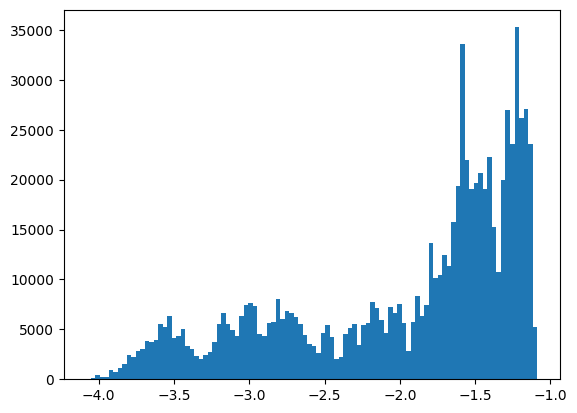

In [8]:
z_vals = pc_3d[:, 2].flatten()
# z_vals = z_vals[z_vals > -10000000000.0]
plt.hist(z_vals, bins=100)
plt.show()


In [9]:
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(pc_3d)
pcd.colors = o3d.utility.Vector3dVector(rgb_3d / 255.0)

# Create and position the sphere
sphere = o3d.geometry.TriangleMesh.create_sphere(radius=0.01)
sphere.translate((0.04752582311630249, -0.03126762807369232, -1.212427020072937))
sphere.paint_uniform_color([0, 1, 0])  # Red color

# Visualize both geometries together
# o3d.visualization.draw_geometries([pcd, sphere])

TriangleMesh with 762 points and 1520 triangles.

Pixel at (500, 500) corresponds to object: apple105


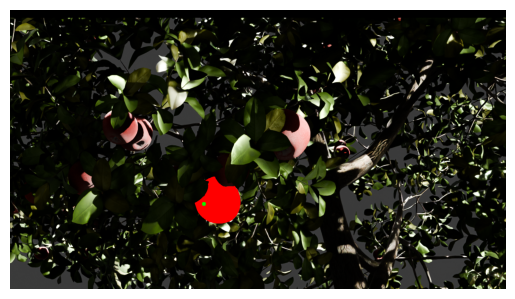

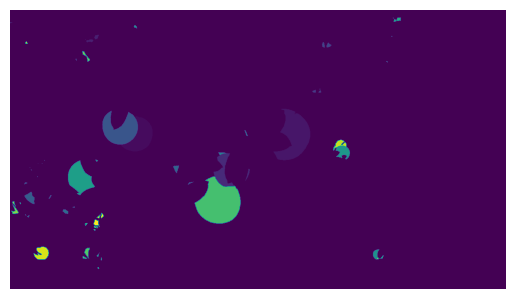

In [10]:

import json
import pyexr

# Load the object ID mask
with pyexr.open("/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_id0000.exr") as exr_file:
    # print(exr_file.channel_map)
    object_id_channel = exr_file.get("V")  # Shape: (height, width, 1)
    object_ids = object_id_channel[:, :, 0]  # Convert to 2D array

# Load the mapping from pass indices to object names
with open("/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_id_map.json", "r") as f:
    id_to_name = json.load(f)

# Example: Get the object name at pixel (y, x)
y, x = 500, 500
object_id = int(object_ids[y, x])
object_name = id_to_name.get(str(object_id), "Unknown")

print(f"Pixel at ({y}, {x}) corresponds to object: {object_name}")
img_cp = rgb_img.copy()
img_cp[object_ids == object_id] = [255, 0, 0]  # Change color to red for the selected object
# draw circle at y,x
cv2.circle(img_cp, (x, y), 5, (0, 255, 0), -1)  # Draw a green circle at (x, y)
plt.imshow(img_cp)
plt.axis('off')
plt.show()

# build apple instance mask
visible_ids = np.unique(object_ids).astype(int)
visible_ids = visible_ids[visible_ids != 0]
visible_apples = []
for id in visible_ids:
    name = id_to_name.get(str(id), "Unknown")
    if 'apple' in name and 'stem' not in name:
        visible_apples.append((id, name))
img_cp  = rgb_img.copy()
mask = np.zeros(img_cp.shape[:2], dtype=np.uint8)
for i, (id, name) in enumerate(visible_apples):
    mask[object_ids == id] = i+1

plt.imshow(mask)
plt.axis('off')
plt.savefig('/home/siddhartha/Downloads/mask.png', dpi=300, bbox_inches='tight')
plt.show()

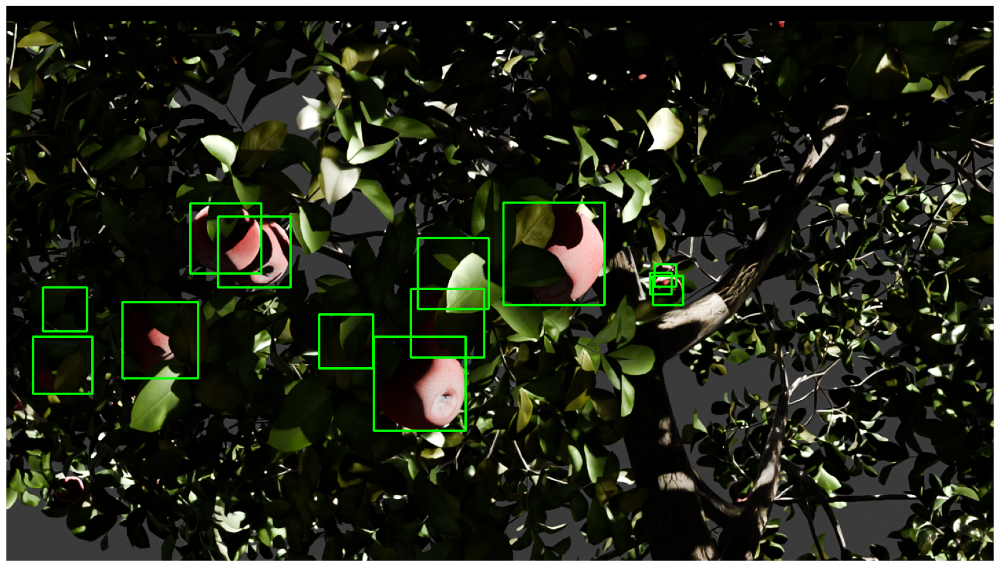

In [11]:
apple_json_path = '/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard/c2083317-49fc-4530-9a23-447f6ca19da1_apple_data.json'
with open(apple_json_path, 'r') as f:
    apple_data = json.load(f)
rgb_cp = rgb_img.copy()
for i, (key, inner_json_str) in enumerate(apple_data.items()):
    apple_data[key] = json.loads(inner_json_str)
    bbox = apple_data[key]['apple_bbox']
    x1, y1, x2, y2 = bbox
    cv2.rectangle(rgb_cp, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
    # # Show cropped RGB image for each bbox
    # cropped = rgb_img[int(min(y1, y2)):int(max(y1, y2)), int(min(x1, x2)):int(max(x1, x2))]
    # plt.figure()
    # plt.imshow(cropped)
    # plt.title(f"{key}")
    # plt.axis('off')
    # plt.show()
    # if i ==5:
    #     break
    
plt.figure(figsize=(20, 20))
plt.imshow(rgb_cp)
plt.axis('off')
plt.show()
    

In [12]:
import os

In [19]:
base_path = '/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard-5-20'

files = os.listdir(base_path)
ids = set([file.split('_')[0] for file in files if file.endswith('apple_data.json')])
print(ids)
print(len(ids))

{'250a13a8-b5ed-4ddf-9845-fbdf7b03a24f', '0959ede1-476d-4b8d-a9ae-679a2507b2ef', '25dfc119-d541-4aa2-8561-27cc33e1976f', '141df888-80b1-41f5-a115-0301ee7ffec0', '775a9840-68b5-437b-b2fd-756d60451d90', '3d6ed308-d3c2-49f8-8de0-ace2248833e6', 'f00a6884-f36b-4953-a9c4-1d8e44e5851d', '48204678-85e5-4d74-9b87-f7991f0a9a17', 'cdafc1ab-7e62-489f-8973-069ae9e3324e', '22edb105-5391-44a6-8379-10cecba33ae1', '9c2eddd9-a83c-4ae1-ab18-29ac79dcda7c', '01fb87da-997a-4a8c-8d13-6b50be3b0f05', '3c31c771-354b-405c-89ff-3e21888f2e45', '632e0536-f377-40a2-93a0-5e85253acab3', '0c45de52-b148-48a7-b961-7c0336909a66', '6bf496d1-ed13-4a81-86b4-5675123168f4', '0ea38832-53ae-48e7-89b6-24cb4e427137', 'ae7239ab-d2a1-4ef2-ae9f-406121e46928', '959250e7-af91-41b0-b203-95b6fa3f98d0', '4df79b53-2d89-4e32-a23c-e777540d8249', '9ef981ac-6ca6-478d-ae5e-f908baf5e2a4', '8f66765c-1d01-4026-b300-3f71bebe47f7', '8512675c-1415-4e63-8660-215f2b5f5324', 'bcf8f1da-0c8a-46cf-b37d-dc74264c863d', 'f57d8d4b-f67c-400f-884a-ba4a3cf4bfe7',

In [20]:
depths = {}
instance_pixel_counts = {}
bboxes = {}
num_missing=0
num_low_visible = 0
num_good = 0
num_far =0
for sample_id in ids:
    # show rgb, depth, instance mask and apple data
    rgb_path = os.path.join(base_path, f'{sample_id}_rgb0000.png')
    id_path = os.path.join(base_path, f'{sample_id}_id0000.exr') 
    apple_data_path = os.path.join(base_path, f'{sample_id}_apple_data.json')
    id_map_path = os.path.join(base_path, f'{sample_id}_id_map.json')

    rgb_img = cv2.imread(rgb_path)
    rgb_img = cv2.cvtColor(rgb_img, cv2.COLOR_BGR2RGB)
    with open(id_map_path, 'r') as f:
        id_to_name = json.load(f)
    with open(apple_data_path, 'r') as f:
        apple_data = json.load(f)
    with pyexr.open(id_path) as exr_file:
        object_id_channel = exr_file.get("V")  # Shape: (height, width, 1)
        object_ids = object_id_channel[:, :, 0]  # Convert to 2D array
    # build apple instance mask
    visible_ids = np.unique(object_ids).astype(int)
    visible_ids = visible_ids[visible_ids != 0]
    visible_apples = []
    for id in visible_ids:
        name = id_to_name.get(str(id), "Unknown")
        if 'apple' in name and 'stem' not in name:
            visible_apples.append((id, name))
    img_cp  = rgb_img.copy()
    mask = np.zeros(img_cp.shape[:2], dtype=np.uint8)
    for i, (id, name) in enumerate(visible_apples):
        mask[object_ids == id] = i+1
        pixel_count = np.sum(mask == i+1)
        instance_pixel_counts[sample_id+ name] =pixel_count
        

    rgb_cp = rgb_img.copy()
    for apple_name, inner_json_str in apple_data.items():
        apple_data[apple_name] = json.loads(inner_json_str)
        apple_center = apple_data[apple_name]['apple_center']
        depths[sample_id + apple_name] = abs(apple_center[-1])
        bbox = apple_data[apple_name]['apple_bbox']
        bboxes[sample_id + apple_name] = bbox
        bbox_size = abs(max(bbox[0], bbox[2]) - min(bbox[0], bbox[2])) * abs(max(bbox[1], bbox[3]) - min(bbox[1], bbox[3]))
        if sample_id + apple_name not in instance_pixel_counts:
            print(f"Missing {sample_id + apple_name}")
            num_missing += 1
            continue
        visible_pixels =  instance_pixel_counts[sample_id + apple_name]
        visible_pct = visible_pixels / bbox_size
        if visible_pct < 0.1:
            num_low_visible += 1
            continue
        if (.5 < abs(apple_center[-1]) < 2.3):
            num_good +=1
            # if (0.1<visible_pct < 0.15) :
            #     x1, y1, x2, y2 = np.array(bbox).astype(int).tolist()
            #     try:
            #         plt.imshow(rgb_img[int(min(y1, y2)):int(max(y1, y2)), int(min(x1, x2)):int(max(x1, x2))])
            #         # draw mask
            #         plt.imshow(mask[int(min(y1, y2)):int(max(y1, y2)), int(min(x1, x2)):int(max(x1, x2))], alpha=0.5)
            #         plt.axis('off')
            #         plt.title(f"{visible_pixels}/{bbox_size}={visible_pct:.2f}\nDepth={depths[sample_id + apple_name]:.2f}m")
            #         plt.show()
            #         rgb_cp = rgb_img.copy()
            #         # draw bbox
            #         cv2.rectangle(rgb_cp, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
            #         plt.imshow(rgb_cp)
            #         plt.axis('off')
            #         plt.show()
            #     except Exception as e:
            #         print(e)
            #         print(f"Error with bbox: {bbox}")
        else:
            num_far += 1
            continue

                
print(f"Total apples: {num_good + num_low_visible + num_far + num_missing}")
print(f"Good apples: {num_good}")
print(f"Low visible apples: {num_low_visible}")
print(f"Far apples: {num_far}")
print(f"Missing apples: {num_missing}")

Missing 8515473b-79ea-4ca5-b17e-2c4eec2b1066apple14
Missing 8515473b-79ea-4ca5-b17e-2c4eec2b1066apple27
Missing 8515473b-79ea-4ca5-b17e-2c4eec2b1066apple41
Missing 8515473b-79ea-4ca5-b17e-2c4eec2b1066apple54
Missing 8515473b-79ea-4ca5-b17e-2c4eec2b1066apple55
Missing 8515473b-79ea-4ca5-b17e-2c4eec2b1066apple136
Missing 17477559144473340apple7
Missing 17477559144473340apple27
Missing 17477559144473340apple31
Missing 17477559144473340apple54
Missing 17477559144473340apple55
Missing 17477559144473340apple70
Missing 17477559144473340apple114
Missing 17477559144473340apple123
Missing 17477559144473340apple173
Total apples: 22831
Good apples: 9442
Low visible apples: 9879
Far apples: 3495
Missing apples: 15


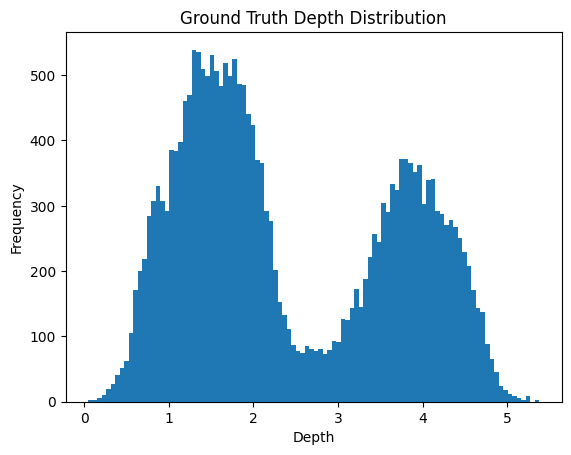

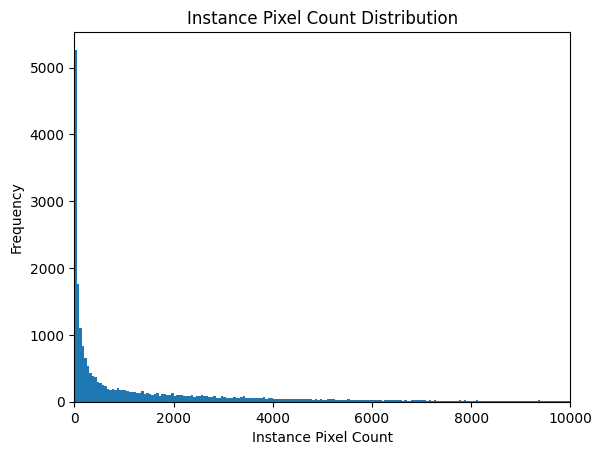

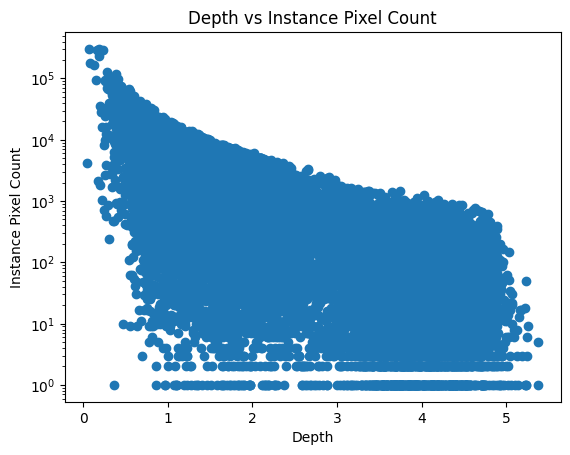

proportion of apples with >500 pixels and < 12000:  0.4566532258064516


In [22]:


# correlation between depth and instance pixel count
depths_list = [depth for name, depth in depths.items() if name in instance_pixel_counts]
instance_pixel_counts_list = [pixel_count for name, pixel_count in instance_pixel_counts.items() if name in depths]

# # distribution of depths
plt.hist(depths_list, bins=100)
plt.xlabel('Depth')
plt.ylabel('Frequency')
plt.title('Ground Truth Depth Distribution')
plt.show()

# # distribution of instance pixel counts
plt.hist([cnt for cnt in instance_pixel_counts_list if cnt < 10000], bins=200)
plt.xlabel('Instance Pixel Count')
plt.xlim(0, 10000)
plt.ylabel('Frequency')
plt.title('Instance Pixel Count Distribution')
plt.show()

plt.scatter(depths_list, instance_pixel_counts_list)
plt.yscale('log')
plt.xlabel('Depth')
plt.ylabel('Instance Pixel Count')
plt.title('Depth vs Instance Pixel Count')
plt.show()

print("proportion of apples with >500 pixels and < 12000: ", len([cnt for cnt in instance_pixel_counts_list if cnt > 500 and cnt < 12000]) / len(instance_pixel_counts_list))


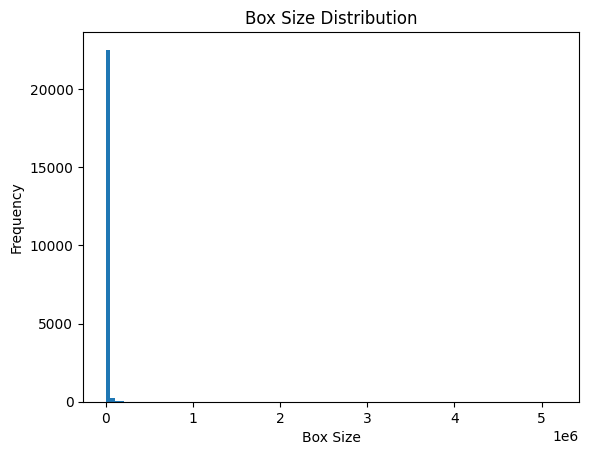

In [23]:
box_sizes = {}
for name, bbox in bboxes.items():
    x1, y1, x2, y2 = bbox
    box_sizes[name] =abs(x2-x1) * abs(y2-y1)

# distribution of box sizes
plt.hist([x for x in list(box_sizes.values()) ], bins=100)
plt.xlabel('Box Size')
plt.ylabel('Frequency')
plt.title('Box Size Distribution')
plt.show()



In [24]:
len(list(box_sizes.keys()))

22831

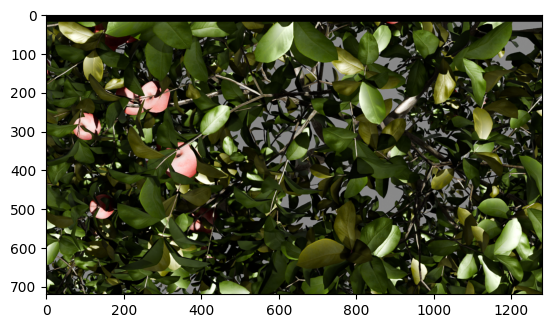

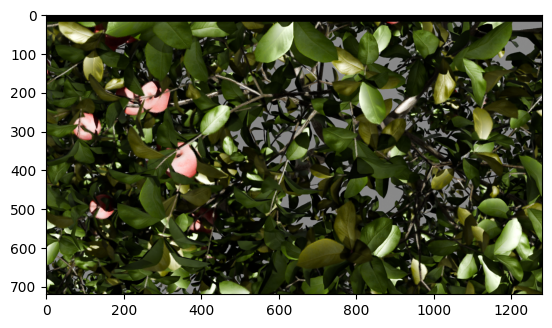

In [31]:
orig_pc = np.load("/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard-5-20/becfcd92-3a09-4028-9e61-49ef65b86d48_pc.npy")
orig_rgb = cv2.imread("/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard-5-20/becfcd92-3a09-4028-9e61-49ef65b86d48_rgb0000.png")
orig_rgb = cv2.cvtColor(orig_rgb, cv2.COLOR_BGR2RGB)

processed_pc = np.load("/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard-5-20-processed/becfcd92-3a09-4028-9e61-49ef65b86d48_pc.npy")
processed_rgb = cv2.imread("/home/siddhartha/RIVAL/learning2localize/blender/dataset/apple_orchard-5-20-processed/becfcd92-3a09-4028-9e61-49ef65b86d48_rgb0000.png")
processed_rgb = cv2.cvtColor(processed_rgb, cv2.COLOR_BGR2RGB)

new_save_dir = '/home/siddhartha/Downloads/tests'
os.makedirs(new_save_dir, exist_ok=True)
np.save(os.path.join(new_save_dir, 'orig_pc.npy'), orig_pc)
np.save(os.path.join(new_save_dir, 'processed_pc.npy'), processed_pc)
orig_rgb_bgr = cv2.cvtColor(orig_rgb, cv2.COLOR_RGB2BGR)
processed_rgb_bgr = cv2.cvtColor(processed_rgb, cv2.COLOR_RGB2BGR)
cv2.imwrite(os.path.join(new_save_dir, 'orig_rgb.png'), orig_rgb_bgr)
cv2.imwrite(os.path.join(new_save_dir, 'processed_rgb.png'), processed_rgb_bgr)


plt.imshow(orig_rgb)
plt.show()
plt.imshow(processed_rgb)
plt.show()

In [32]:
import sys 
sys.path.append("/home/siddhartha/RIVAL/learning2localize/blender")
from learning2localize.blender.preprocess import pc_img_to_pcd 

orig_pcd = pc_img_to_pcd(orig_pc, orig_rgb)
processed_pcd = pc_img_to_pcd(processed_pc, processed_rgb)

o3d.visualization.draw_geometries([orig_pcd])
o3d.visualization.draw_geometries([processed_pcd])


In [37]:
np.nanmedian(processed_pc.reshape(-1, 3), axis=0), np.nanmin(processed_pc.reshape(-1, 3), axis=0), np.nanmax(processed_pc.reshape(-1, 3), axis=0)

(array([-0.03570236, -0.00133265,  0.55643568]),
 array([-0.96042234, -0.65609169, -1.75723657]),
 array([0.7170805 , 0.64683113, 0.81511663]))

#### normalization testing

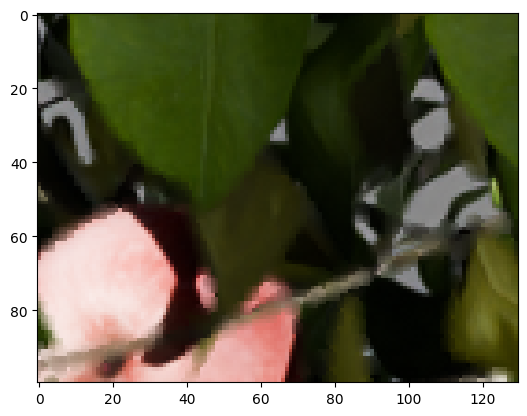

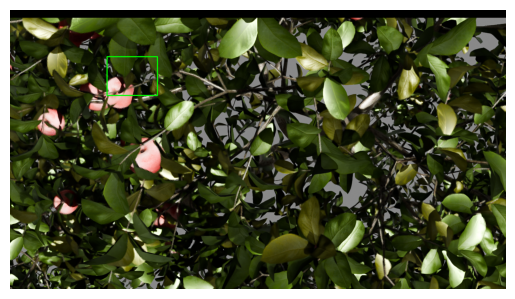

Voxel size: 0.005, Center: [-0.21258343 -0.14073392  0.26020038], Scale: 1.0449647295615552
Points mean:  [0.01129783 0.0116961  0.16954534]
Points std:  [0.07978545 0.05349075 0.41130397]
Points median:  [0.04218254 0.0340878  0.34480113]
Points min:  [-0.47009199 -0.25490134 -1.90233035]
Points max:  [0.08509624 0.05794392 0.50058979]
Points shape:  (12357, 3)

Voxel size: 0.01, Center: [-0.329305   -0.20840035 -0.21342239], Scale: 0.9133620130453766
Points mean:  [0.14071902 0.08746634 0.71252325]
Points std:  [0.09128143 0.06119802 0.47056713]
Points median:  [0.17605378 0.11308438 0.91303096]
Points min:  [-0.41003236 -0.21754406 -1.6578808 ]
Points max:  [0.22515075 0.14037782 1.09126659]
Points shape:  (12357, 3)

Voxel size: 0.05, Center: [-0.34335741 -0.22153136 -0.35686325], Scale: 1.103520710050916
Points mean:  [0.12920447 0.08429334 0.71972599]
Points std:  [0.07555181 0.05065238 0.389479  ]
Points median:  [0.15845035 0.10549687 0.88568221]
Points min:  [-0.32664142 -0.16

In [46]:
from scipy.spatial import KDTree
def iqr_scale_point_cloud(points):
    """Scale point cloud using IQR to reduce outlier influence."""
    q1 = np.percentile(points, 25, axis=0)
    q3 = np.percentile(points, 75, axis=0)
    iqr = q3 - q1
    
    # Avoid division by zero
    iqr = np.maximum(iqr, 1e-6)
    
    # Scale by IQR
    scaled_points = points / (iqr * 1.5)  # 1.5 is a common multiplier for IQR
    
    return scaled_points, iqr
def median_center_point_cloud(points):
    center = np.median(points, axis=0)
    centered_points = points - center
    return centered_points, center
def voxel_normalize(points, voxel_size=0.05, percentile=95):
    """Normalize using voxel grid to handle irregular density.
    NaNs are preserved and ignored in normalization."""
    
    # Create voxel grid with valid (non-NaN) points only
    voxel_grid = {}
    for i, point in enumerate(points):
        if np.any(np.isnan(point)):
            continue  # skip NaNs in voxel computation
        voxel_idx = tuple(np.floor(point / voxel_size).astype(int))
        if voxel_idx not in voxel_grid:
            voxel_grid[voxel_idx] = []
        voxel_grid[voxel_idx].append(i)

    # Compute voxel centers from valid points
    voxel_centers = []
    for point_indices in voxel_grid.values():
        voxel_points = points[point_indices]
        voxel_centers.append(np.mean(voxel_points, axis=0))

    voxel_centers = np.array(voxel_centers)
    
    # Center and scale using voxel centers 
    center = np.median(voxel_centers, axis=0)
    distances = np.linalg.norm(voxel_centers - center, axis=1)
    scale = np.percentile(distances, percentile)

    # Normalize all points 
    centered_points = points - center
    scaled_points = centered_points / scale

    return scaled_points, center, scale

pt1 = (250, 120)
pt2 = (380, 220)
x1, y1  = pt1
x2, y2  = pt2
orig_pc_cropped = processed_pc[y1:y2, x1:x2, :]
orig_rgb_cropped = processed_rgb[y1:y2, x1:x2, :]

plt.imshow(orig_rgb_cropped)
plt.show()
rgb_cp = processed_rgb.copy()
cv2.rectangle(rgb_cp, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
plt.imshow(rgb_cp)
plt.axis('off')
plt.show()

orig_pc_3d = orig_pc_cropped.reshape(-1, 3)
processed_rgb_3d = orig_rgb_cropped.reshape(-1, 3)
# drop nans
processed_rgb_3d = processed_rgb_3d[~np.isnan(orig_pc_3d).any(axis=1)]
orig_pc_3d = orig_pc_3d[~np.isnan(orig_pc_3d).any(axis=1)]

for voxel_size in [0.005, 0.01, 0.05, 0.1]:
    new_pts, center, scale = voxel_normalize(orig_pc_3d, voxel_size=voxel_size)
# new_pts, center, scale = voxel_normalize(orig_pc_3d)

    # Visualize the scaled point cloud
    pcd = o3d.geometry.PointCloud()
    pcd.points = o3d.utility.Vector3dVector(new_pts)
    pcd.colors = o3d.utility.Vector3dVector(processed_rgb_3d / 255.0)

    raw_pcd = o3d.geometry.PointCloud()
    raw_pcd.points = o3d.utility.Vector3dVector(orig_pc_3d + np.array([1, 0, 0]))
    raw_pcd.colors = o3d.utility.Vector3dVector(processed_rgb_3d / 255.0)

    # Create another for "Raw"
    frame = o3d.geometry.TriangleMesh.create_coordinate_frame(size=0.1)
    frame.translate(np.mean(np.asarray(raw_pcd.points), axis=0))

    # Simulated labeling (real text not directly supported in open3d GUI)
    # print("NOTE: Open3D does not support 3D text labels in its native viewer. You can use coordinate frames as markers or use external rendering tools for labeled visualization.")

    # Visualize with coordinate frames as stand-ins for labels
    # o3d.visualization.draw_geometries([pcd, raw_pcd,frame])

    print(f"Voxel size: {voxel_size}, Center: {center}, Scale: {scale}")
    print("Points mean: ", np.mean(new_pts, axis=0))
    print("Points std: ", np.std(new_pts, axis=0))
    print("Points median: ", np.median(new_pts, axis=0))
    print("Points min: ", np.min(new_pts, axis=0))
    print("Points max: ", np.max(new_pts, axis=0))
    print("Points shape: ", new_pts.shape)
    print()

In [48]:
def rotate_point_cloud(point_cloud: np.ndarray,
                       rotation_range=(-np.pi, np.pi)
                       ):
    """
    Rotate the point cloud randomly within the specified range.
    Args:
        point_cloud (np.ndarray): The original point cloud with shape (N, 3) or (N, 6).
                                  Format: (x, y, z[, r, g, b])
        rotation_range (tuple): The range for random rotation in radians.
    Returns:
        np.ndarray: The randomly rotated point cloud with the same shape as the input.
    """
    point_cloud = np.array(point_cloud)
    
    # Split into position and color (if applicable)
    if point_cloud.shape[1] == 6:
        xyz = point_cloud[:, :3]
        rgb = point_cloud[:, 3:]
    elif point_cloud.shape[1] == 3:
        xyz = point_cloud
        rgb = None
    else:
        raise ValueError("Input point cloud must have shape (N, 3) or (N, 6)")

    # Random rotation angle
    theta = np.random.uniform(rotation_range[0], rotation_range[1])
    rotation_matrix = np.array([[np.cos(theta), -np.sin(theta), 0],
                                 [np.sin(theta),  np.cos(theta), 0],
                                 [0,              0,             1]])

    # Apply rotation
    rotated_xyz = xyz @ rotation_matrix.T

    # Concatenate color if present
    if rgb is not None:
        rotated_point_cloud = np.concatenate([rotated_xyz, rgb], axis=1)
    else:
        rotated_point_cloud = rotated_xyz

    return rotated_point_cloud

orig_pc_6d = np.concatenate([orig_pc_cropped.reshape(-1,3), orig_rgb_cropped.reshape(-1,3)], axis=1)
rotated_pc = rotate_point_cloud(orig_pc_6d, rotation_range=(-np.pi/3, np.pi/3))


# plotly plot
figure = go.Figure()    
figure.add_trace(go.Scatter3d(
    x=np.asarray(orig_pc_6d[:, 0]).flatten(),
    y=np.asarray(orig_pc_6d[:, 1]).flatten(),
    z=np.asarray(orig_pc_6d[:, 2]).flatten(),
    mode='markers',
    marker=dict(size=2,
            color=orig_pc_6d[:, 3:6] / 255.0,   # RGB -> [0,1]
            opacity=0.6)))
figure.add_trace(go.Scatter3d(
    x=np.asarray(rotated_pc[:, 0]).flatten(),
    y=np.asarray(rotated_pc[:, 1]).flatten(),
    z=np.asarray(rotated_pc[:, 2]).flatten(),
    mode='markers',
    marker=dict(size=2,
            color=rotated_pc[:, 3:6] / 255.0,   # RGB -> [0,1]
            opacity=0.6)))
figure.update_layout(
    scene=dict(
        xaxis=dict(title='X-axis'),
        yaxis=dict(title='Y-axis'),
        zaxis=dict(title='Z-axis'),
        aspectmode='data'
    ),
    title="3D Point Cloud Visualization",
    width=800,
    height=800
)
figure.show()
